## Insurance Claim Fraud Detection

### Project Description

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, we are provided with a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

In [1]:
#Importing necessary libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [2]:
#Loading the data set
df = pd.read_csv('https://raw.githubusercontent.com/dsrscientist/Data-Science-ML-Capstone-Projects/master/Automobile_insurance_fraud.csv')
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,...,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


#### Independent Variables in data set

1.	months_as_customer: Number of months of patronage

2.	age: the length of time a customer has lived or a thing has existed

3.	policy_number: It is a unique id given to the customer, to track the subscription status and other details of customer

4.	policy_bind_date:date which document that is given to customer after we accept your proposal for insurance

5.	policy_state: This identifies who is the insured, what risks or property are covered, the policy limits, and the policy period

6.	policy_csl: is basically Combined Single Limit

7.	policy_deductable: the amount of money that a customer is responsible for paying toward an insured loss

8.	policy_annual_premium: This means the amount of Regular Premium payable by the Policyholder in a Policy Year

9.	umbrella_limit: This means extra insurance that provides protection beyond existing limits and coverages of other policies

10.	insured_zip: It is the zip code where the insurance was made

11.	insured_sex: This refres to either of the two main categories (male and female) into which customer are divided on the basis of their reproductive functions

12.	insured_education_level: This refers to the Level of education of the customer

13.	insured_occupation: This refers Occupation of the customer

14.	insured_hobbies: This refers to an activity done regularly by customer in his/her leisure time for pleasure.

15.	insured_relationship: This whether customer is: single; or. married; or. in a de facto relationship (that is, living together but not married); or. in a civil partnership

16.	capital-gains: This refers to profit accrued due to insurance premium

17.	capital-loss: This refers to the losses incurred due to insurance claims

18.	incident_date: This refers to the date which claims where made by customers

19.	incident_type: This refers to the type of claim/vehicle damage made by customer

20.	collision_type: This refers to the area of damage on the vehicle

21.	incident_severity: This refers to the extent/level of damage

22.	authorities_contacted: This refers to the government agencies that were contacted after damage

23.	incident_state: This refers to the state at which the accident happened

24.	incident_city: This refers to the city at which the accident happened

25.	1ncident_location: This refers to the location at which the accident happened

26.	incident_hour_of_the_day: The period of the day which accident took place

27.	number_of_vehicles_involved: This refers to number of vehicles involved the accident

28.	property_damage: This refers to whether property was damaged or not

29.	bodily_injuries: This refers to injuries sustained

30.	witnesses: This refers to the number of witnesses involved

31.	police_report_available: This refers to whether the report on damage was documented or not

32.	total_claim_amount: This refers to the financial implications involved in claims

33.	injury_claim: This refers to physical injuries sustained

34.	property_claim: This refers to property damages during incident

35.	vehicle_claim: This refers to property damages during incident

36.	auto_make: This refers to the make of the vehicle

37.	auto_model: This refers to the model of the vehicle

38.	auto_year: This refers to the year which the vehicle was manufactured

39.	_c39:

40.	fraud_reported

### To predict:
We have to work with some auto insurance data to demonstrate how we can create a predictive model that predicts if an insurance claim is fraudulent or not. 

#### Label: fraud_reported

### EDA (Exploratory Data Analysis)

In [3]:
#Let's check for shape
df.shape

(1000, 40)

The data set contains 1000 rows and 40 columns.

In [4]:
#Checking for columns
df.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

These are the column names present in the dataset.

In [5]:
#Checking for data types
df.dtypes

months_as_customer               int64
age                              int64
policy_number                    int64
policy_bind_date                object
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_date                   object
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_location               object
incident_hour_of_the_day 

Here we can see that the data set contains int, float and object data types.

In [6]:
#Checking for info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

It gives the information about the columns, rows, column names, non-null values, data types, memory usage.

In [3]:
#Checking for categorical columns
cat_col = []
for i in df.dtypes.index:
    if df.dtypes[i] == "object":
        cat_col.append(i)
print("Categorical columns:", cat_col)
print("\n")


#Checking for numerical columns
num_col = []
for i in df.dtypes.index:
    if df.dtypes[i] != "object":
        num_col.append(i)
print("Numerical columns:", num_col)
print("\n")

Categorical columns: ['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_date', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'incident_location', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


Numerical columns: ['months_as_customer', 'age', 'policy_number', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year', '_c39']




In [8]:
#Checking for unique values 
df.nunique().to_frame('columns')

,columns
months_as_customer,391
age,46
policy_number,1000
policy_bind_date,951
policy_state,3
policy_csl,3
policy_deductable,3
policy_annual_premium,991
umbrella_limit,11
insured_zip,995


Here we can see that policy_number has the highest number of unique values and it is also of no use so let's just drop it.

In [4]:
#Dropping policy_number
df.drop('policy_number', axis=1, inplace=True)

In [5]:
df.head()

,months_as_customer,age,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


From the above info() we can see that policy_bind_date has object values, so let's just change the data type to datetime format.

In [5]:
#Converting policy_bind_date column from object data type to datetime
df['policy_bind_date'] = pd.to_datetime(df.policy_bind_date, format = '%d-%m-%Y')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   months_as_customer           1000 non-null   int64         
 1   age                          1000 non-null   int64         
 2   policy_bind_date             1000 non-null   datetime64[ns]
 3   policy_state                 1000 non-null   object        
 4   policy_csl                   1000 non-null   object        
 5   policy_deductable            1000 non-null   int64         
 6   policy_annual_premium        1000 non-null   float64       
 7   umbrella_limit               1000 non-null   int64         
 8   insured_zip                  1000 non-null   int64         
 9   insured_sex                  1000 non-null   object        
 10  insured_education_level      1000 non-null   object        
 11  insured_occupation           1000 non-null  

We have successfully converted it to datetime format. Now let's set it as index.

In [6]:
#Setting policy_bind_date as DataFrame Index
df.set_index('policy_bind_date', inplace=True)
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
policy_bind_date,,,,,,,,,,,,,,,,,,,,,
2014-10-17,328,48,OH,250/500,1000,1406.91,0,466132,MALE,MD,...,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
2006-06-27,228,42,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,...,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2000-09-06,134,29,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,...,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
1990-05-25,256,41,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,...,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
2014-06-06,228,44,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,...,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1991-07-16,3,38,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,...,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
2014-01-05,285,41,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,...,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
2003-02-17,130,34,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,...,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN


In [13]:
#Checking for nulls in the data set
df.isna().sum()

months_as_customer                0
age                               0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage                   0
bodily_injuries                   0
witnesses                   

Here we can see that _c39 has all nulls so let's just drop it since it has no values at all.

In [7]:
df.drop('_c39', axis=1, inplace=True)
df.head()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
policy_bind_date,,,,,,,,,,,,,,,,,,,,,
2014-10-17,328,48,OH,250/500,1000,1406.91,0,466132,MALE,MD,...,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
2006-06-27,228,42,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,...,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2000-09-06,134,29,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,...,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
1990-05-25,256,41,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,...,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
2014-06-06,228,44,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,...,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


In [15]:
#Let's check for nulls again
df.isna().sum()

months_as_customer             0
age                            0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_cla

There are no nulls in any of the columns as for now. Let's go ahead.

In [16]:
#Checking for data description
df.describe()

,months_as_customer,age,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


This gives the statistical summary about the data set. It gives information about count of values in each column, mean, standard deviation, min, 25%, 50%, 75% quantiles and max values.

From the above describe() method we conclude that:

- The counts of all the values in the columns are the same that means no missing values are there.
- The median(50%) values are little less than mean values that means the data is slightly skewed to right.
- By summerizing the data we can observe that there are some differences between 75% and max values. Hence, there are outliers present in the data set.

In [17]:
#Checking for value counts for each columns
for i in df.columns:
    print(df[i].value_counts())
    print("\n")

194    8
128    7
254    7
140    7
210    7
      ..
390    1
411    1
453    1
448    1
17     1
Name: months_as_customer, Length: 391, dtype: int64


43    49
39    48
41    45
34    44
38    42
30    42
31    42
37    41
33    39
40    38
32    38
29    35
46    33
42    32
35    32
36    32
44    32
28    30
26    26
45    26
48    25
47    24
27    24
57    16
25    14
55    14
49    14
53    13
50    13
24    10
54    10
61    10
51     9
60     9
58     8
56     8
23     7
21     6
59     5
62     4
52     4
64     2
63     2
19     1
20     1
22     1
Name: age, dtype: int64


OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64


1000    351
500     342
2000    307
Name: policy_deductable, dtype: int64


1558.29    2
1215.36    2
1362.87    2
1073.83    2
1389.13    2
          ..
1085.03    1
1437.33    1
988.29     1
1238.89    1
766.19     1
Name: policy_annual_premium, Length: 991, 

Here we can see no nulls or white spaces. Great! Let's go ahead.

### Data Visualization

#### Univariate Analysis

First we will do analysis for categorical data.

N    753
Y    247
Name: fraud_reported, dtype: int64


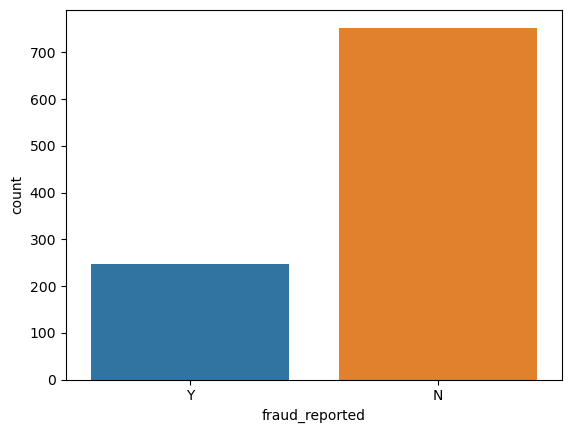

In [24]:
#Visualizing the label
ax = sns.countplot(x='fraud_reported', data=df)
print(df['fraud_reported'].value_counts())

Here we can see that the number of reported fraud cases are much lesser than than number of no reported cases.

OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


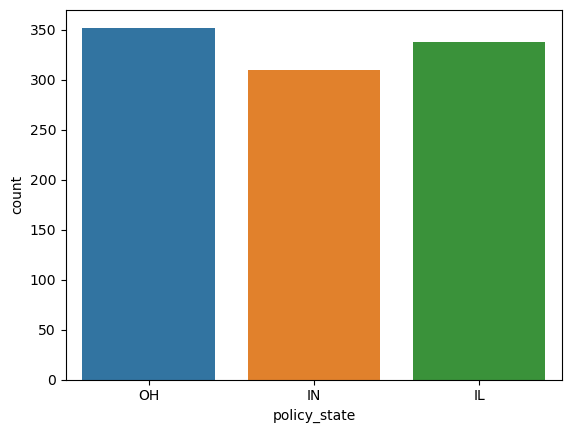

In [25]:
#Visualizing policy_state
ax = sns.countplot(x='policy_state', data=df)
print(df['policy_state'].value_counts())

This identifies that OH and IL are insured with risks or property covered with the policy limits, and the policy period.

250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64


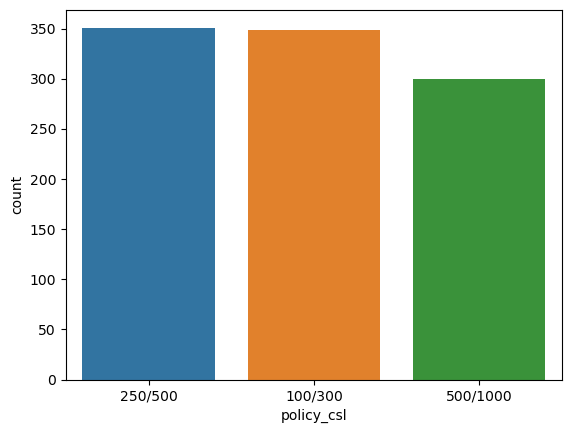

In [26]:
#Visualizing policy_csl
ax = sns.countplot(x='policy_csl', data=df)
print(df['policy_csl'].value_counts())

Here Combined Single Limit of 250/500 and 100/300 are higher than 500/1000.

FEMALE    537
MALE      463
Name: insured_sex, dtype: int64


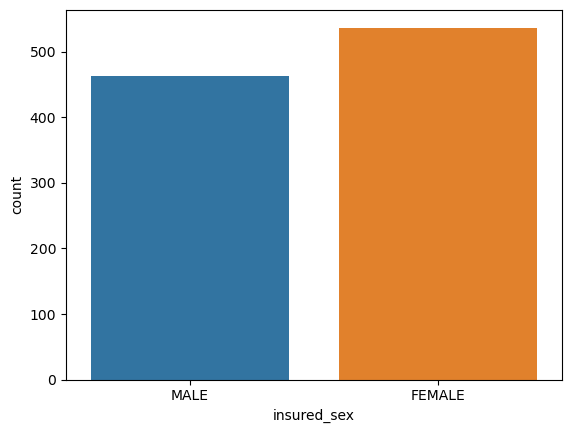

In [27]:
#Visualizing insured_sex
ax = sns.countplot(x='insured_sex', data=df)
print(df['insured_sex'].value_counts())

Here females are more in number than males.

JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64


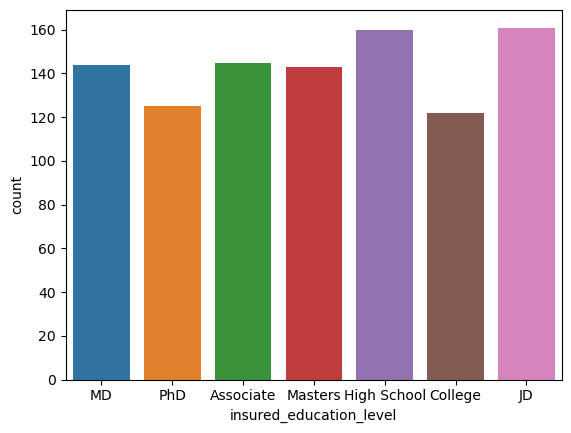

In [28]:
#Visualizing insured_education_level
ax = sns.countplot(x='insured_education_level', data=df)
print(df['insured_education_level'].value_counts())

Here, the number of people with JD degree are higher in number followed by those with High School Level.

machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64


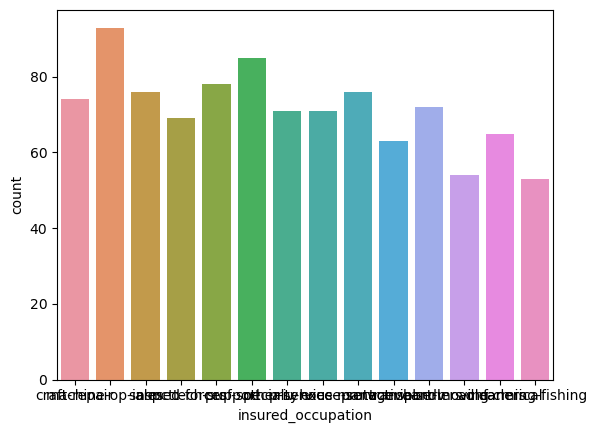

In [29]:
#Visualizing insured_occupation
ax = sns.countplot(x='insured_occupation', data=df)
print(df['insured_occupation'].value_counts())

Here, the number of people with machine-op-inspct is higher followed by prof-speciality and others.

reading           64
exercise          57
paintball         57
bungie-jumping    56
movies            55
golf              55
camping           55
kayaking          54
yachting          53
hiking            52
video-games       50
skydiving         49
base-jumping      49
board-games       48
polo              47
chess             46
dancing           43
sleeping          41
cross-fit         35
basketball        34
Name: insured_hobbies, dtype: int64


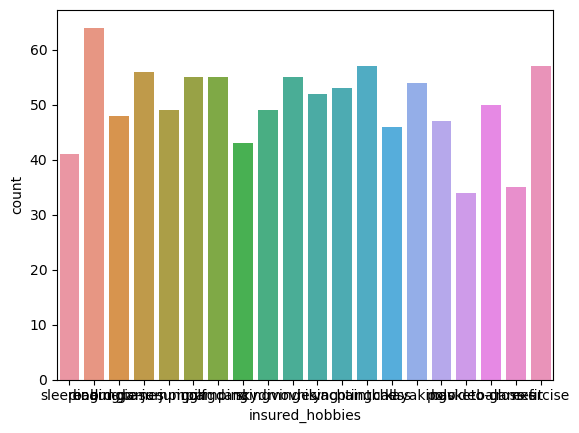

In [30]:
#Visualizing insured_education_hobbies
ax = sns.countplot(x='insured_hobbies', data=df)
print(df['insured_hobbies'].value_counts())

Here, most of the people have the hobby of reading, excercising and paintball followed by others.

own-child         183
other-relative    177
not-in-family     174
husband           170
wife              155
unmarried         141
Name: insured_relationship, dtype: int64


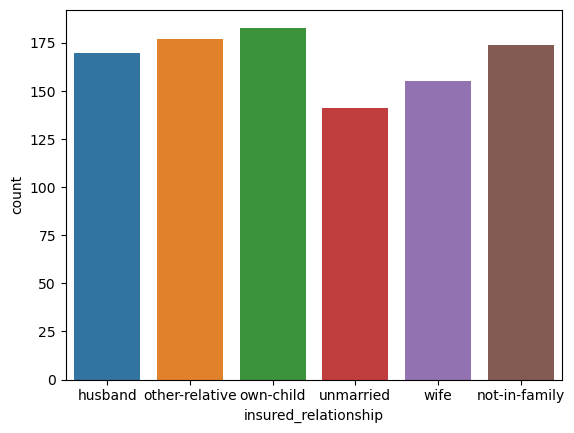

In [31]:
#Visualizing insured_relationship
ax = sns.countplot(x='insured_relationship', data=df)
print(df['insured_relationship'].value_counts())

Those having own-child are more in number followed by others.

Multi-vehicle Collision     419
Single Vehicle Collision    403
Vehicle Theft                94
Parked Car                   84
Name: incident_type, dtype: int64


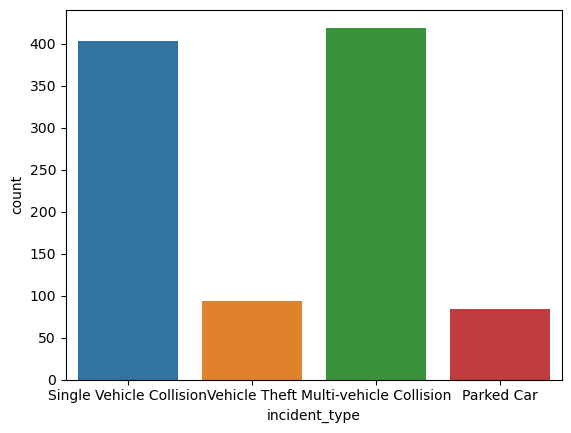

In [37]:
#Visualizing incident_type
ax = sns.countplot(x='incident_type', data=df)
print(df['incident_type'].value_counts())

Here, the claim of Multi-vehicle collision is higher in number followed by Single vehicle collision.

Rear Collision     292
Side Collision     276
Front Collision    254
?                  178
Name: collision_type, dtype: int64


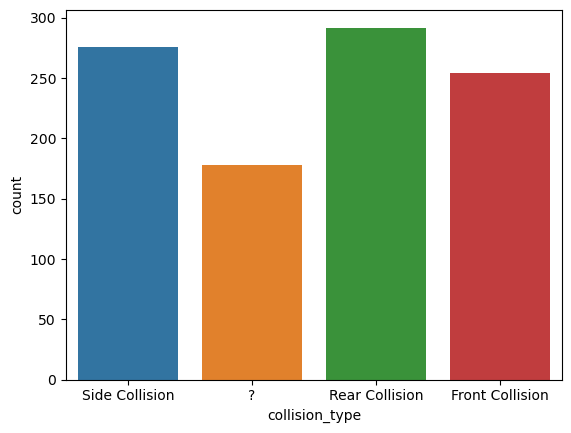

In [38]:
#Visualizing collision_type
ax = sns.countplot(x='collision_type', data=df)
print(df['collision_type'].value_counts())

The claim of Rear collision is higher in number followed by side collision and others.

Minor Damage      354
Total Loss        280
Major Damage      276
Trivial Damage     90
Name: incident_severity, dtype: int64


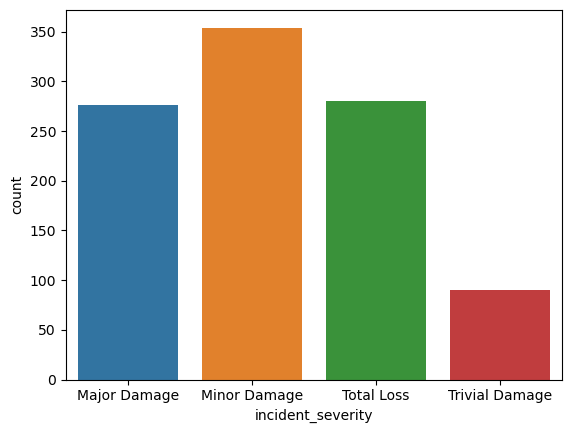

In [39]:
#Visualizing incident_severity
ax = sns.countplot(x='incident_severity', data=df)
print(df['incident_severity'].value_counts())

The claims of Minor damages are more in number than others.

Police       292
Fire         223
Other        198
Ambulance    196
None          91
Name: authorities_contacted, dtype: int64


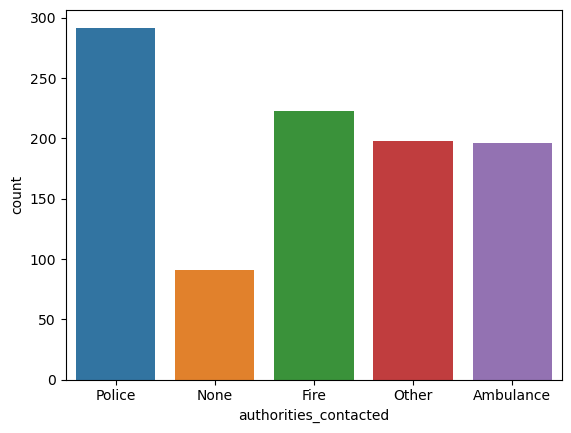

In [40]:
#Visualizing authorities_contacted
ax = sns.countplot(x='authorities_contacted', data=df)
print(df['authorities_contacted'].value_counts())

The people have mostly contacted the Police first than others.

NY    262
SC    248
WV    217
VA    110
NC    110
PA     30
OH     23
Name: incident_state, dtype: int64


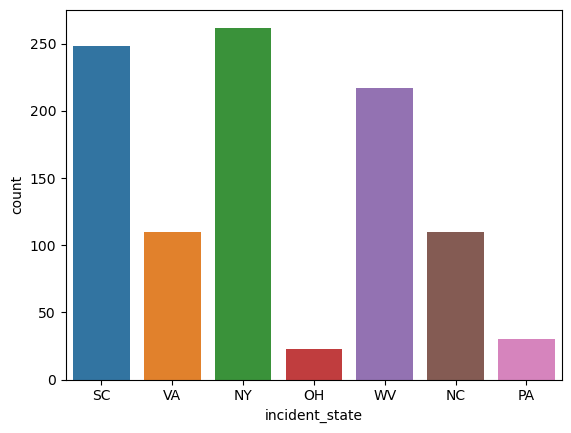

In [41]:
#Visualizing incident_state
ax = sns.countplot(x='incident_state', data=df)
print(df['incident_state'].value_counts())

Most of the incidents took place in NY followed by SC and others.

Springfield    157
Arlington      152
Columbus       149
Northbend      145
Hillsdale      141
Riverwood      134
Northbrook     122
Name: incident_city, dtype: int64


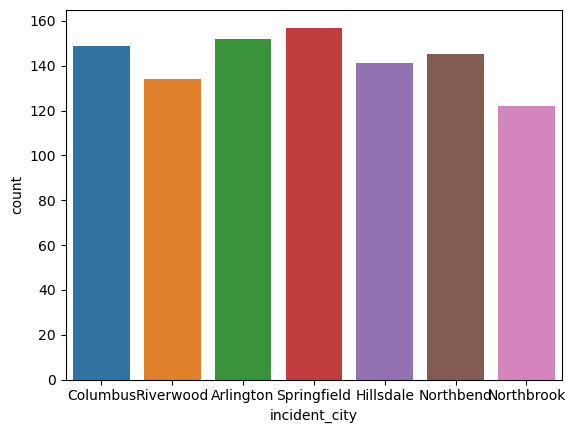

In [42]:
#Visualizing incident_city
ax = sns.countplot(x='incident_city', data=df)
print(df['incident_city'].value_counts())

Most of the incidents took place in Springfield city followed by Arlington city and others.

?      360
NO     338
YES    302
Name: property_damage, dtype: int64


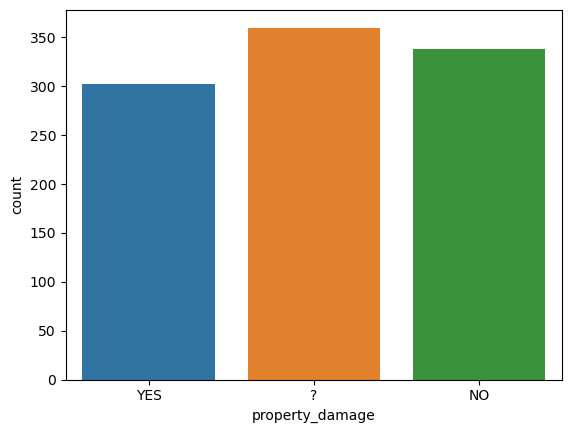

In [44]:
#Visualizing property_damage
ax = sns.countplot(x='property_damage', data=df)
print(df['property_damage'].value_counts())

Here, the '?' has the higher number followed by 'NO' and 'YES'. Let's assume the '?' as unknown property damage.

?      343
NO     343
YES    314
Name: police_report_available, dtype: int64


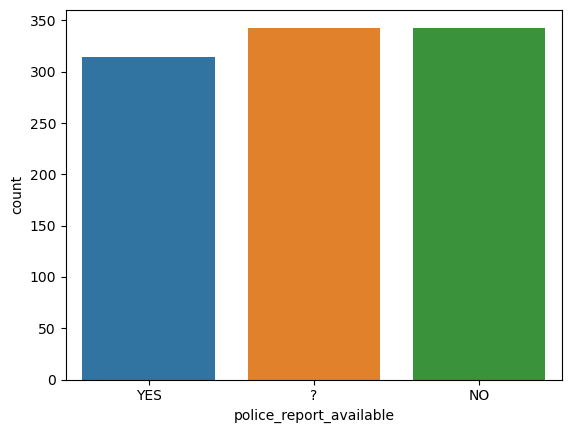

In [45]:
#Visualizing police_report_available
ax = sns.countplot(x='police_report_available', data=df)
print(df['police_report_available'].value_counts())

Here also the '?' has higher number followed by 'NO' and 'YES'. This means that most of the incidents's report is not available.

Saab          80
Dodge         80
Suburu        80
Nissan        78
Chevrolet     76
Ford          72
BMW           72
Toyota        70
Audi          69
Accura        68
Volkswagen    68
Jeep          67
Mercedes      65
Honda         55
Name: auto_make, dtype: int64


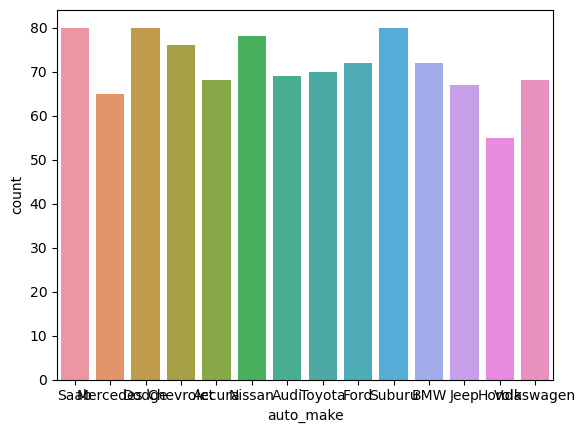

In [46]:
#Visualizing auto_make
ax = sns.countplot(x='auto_make', data=df)
print(df['auto_make'].value_counts())

Here Saab has the higher number followed by Dodge, Suburu and others.

RAM               43
Wrangler          42
A3                37
Neon              37
MDX               36
Jetta             35
Passat            33
A5                32
Legacy            32
Pathfinder        31
Malibu            30
92x               28
Camry             28
Forrestor         28
F150              27
95                27
E400              27
93                25
Grand Cherokee    25
Escape            24
Tahoe             24
Maxima            24
Ultima            23
X5                23
Highlander        22
Civic             22
Silverado         22
Fusion            21
ML350             20
Impreza           20
Corolla           20
TL                20
CRV               20
C300              18
3 Series          18
X6                16
M5                15
Accord            13
RSX               12
Name: auto_model, dtype: int64


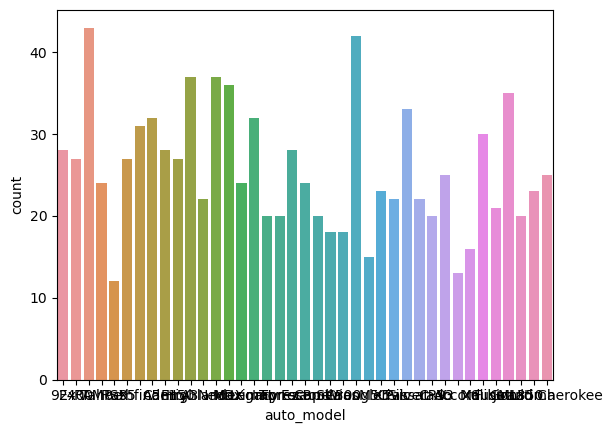

In [47]:
#Visualizing auto_model
ax = sns.countplot(x='auto_model', data=df)
print(df['auto_model'].value_counts())

Here, RAM has the highest number followed by Wrangler and others.

In [51]:
#Checking for numerical columns
num_col = []
for i in df.dtypes.index:
    if df.dtypes[i] != "object":
        num_col.append(i)
print("Numerical columns:", num_col)
print("\n")

Numerical columns: ['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year']




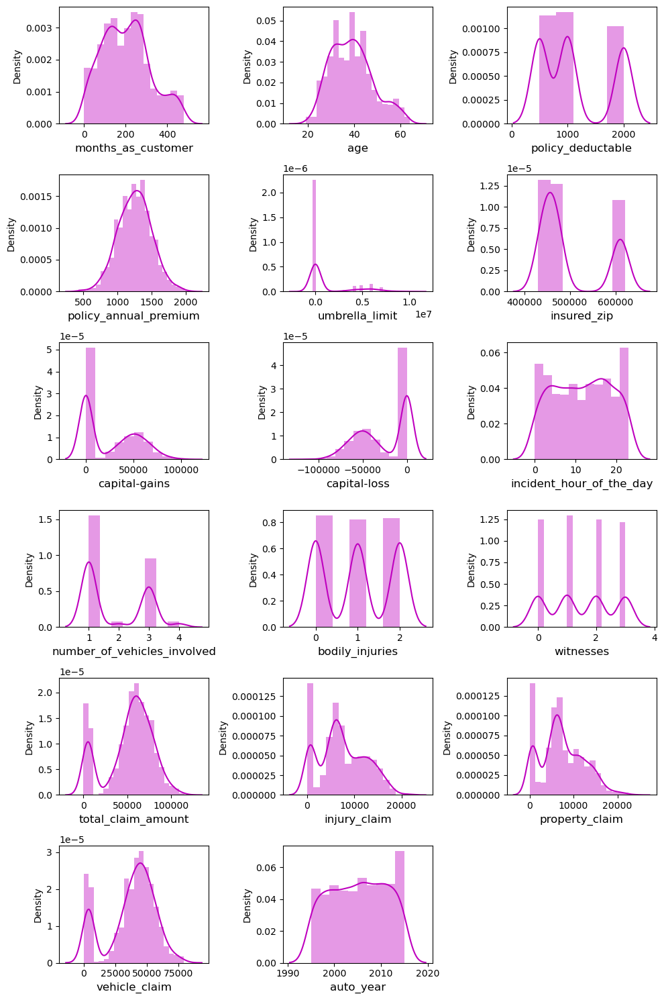

In [58]:
#Visualizing the remaining numerical data using dist plot
plt.figure(figsize= (10,15), facecolor='white')
plotnumber=1
for col in num_col:
    if plotnumber<=17:
        ax = plt.subplot(6,3, plotnumber)
        sns.distplot(df[col], color = "m")
        plt.xlabel(col, fontsize = 12)
        plt.yticks(rotation=0, fontsize=10)
    plotnumber+=1
    plt.tight_layout()

From the above distplot we can notice some skewness in some of the data. We will deal with it later.

### Bivariate Analysis

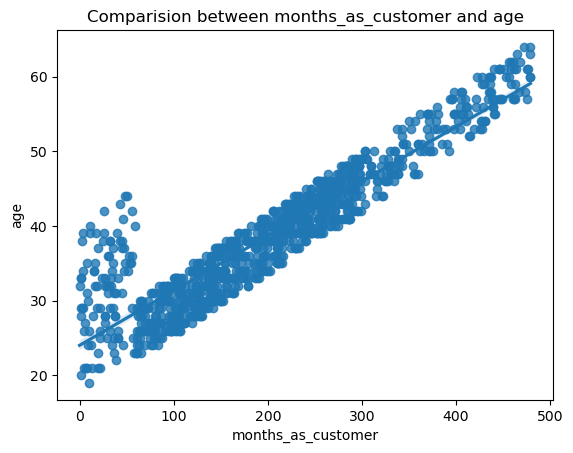

In [60]:
#Comparing months_as_customer and age
plt.title("Comparision between months_as_customer and age")
sns.regplot(x = "months_as_customer", y = "age", data=df)
plt.show()

We can see a positive relation between them.

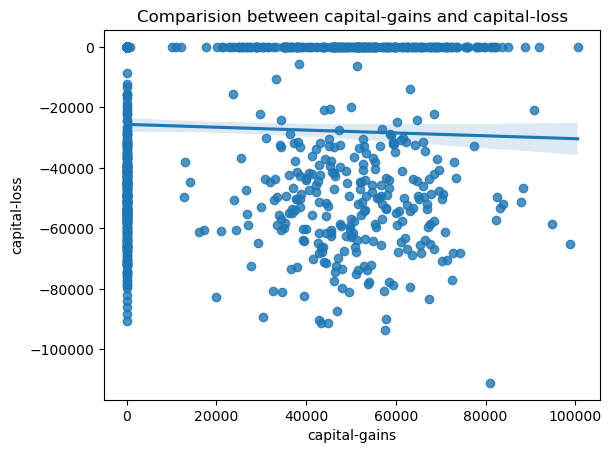

In [67]:
#Comparing capital-gains and capital-loss
plt.title("Comparision between capital-gains and capital-loss")
sns.regplot(x = "capital-gains", y = "capital-loss", data=df)
plt.show()

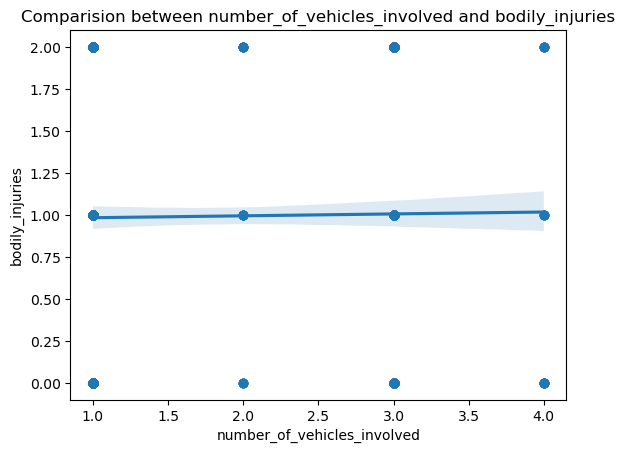

In [69]:
#Comparing number_of_vehicles_involved and bodily_injuries
plt.title("Comparision between number_of_vehicles_involved and bodily_injuries")
sns.regplot(x = "number_of_vehicles_involved", y = "bodily_injuries", data=df)
plt.show()

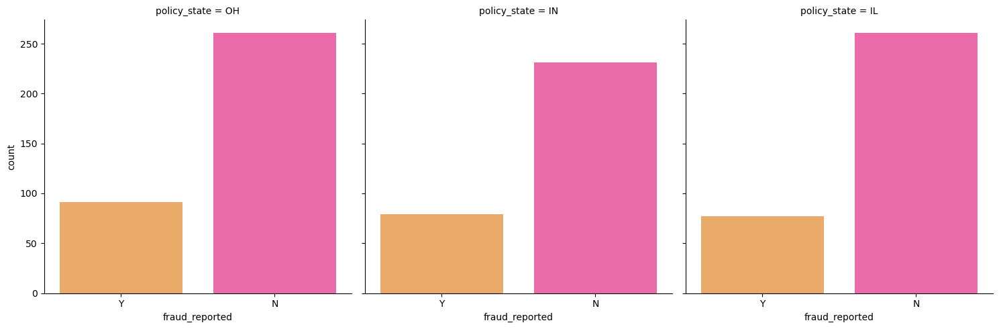

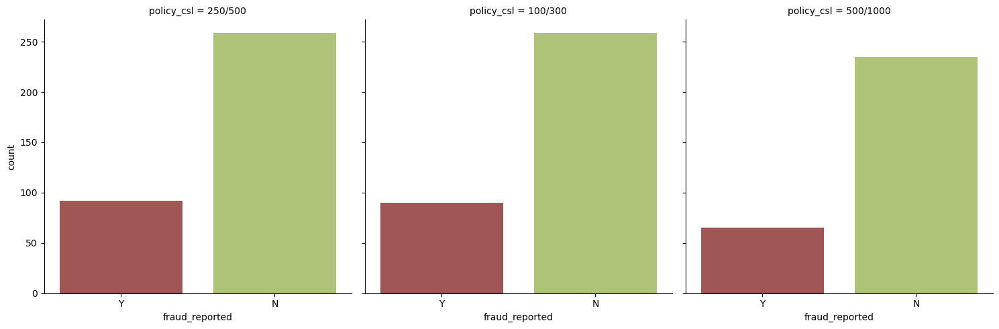

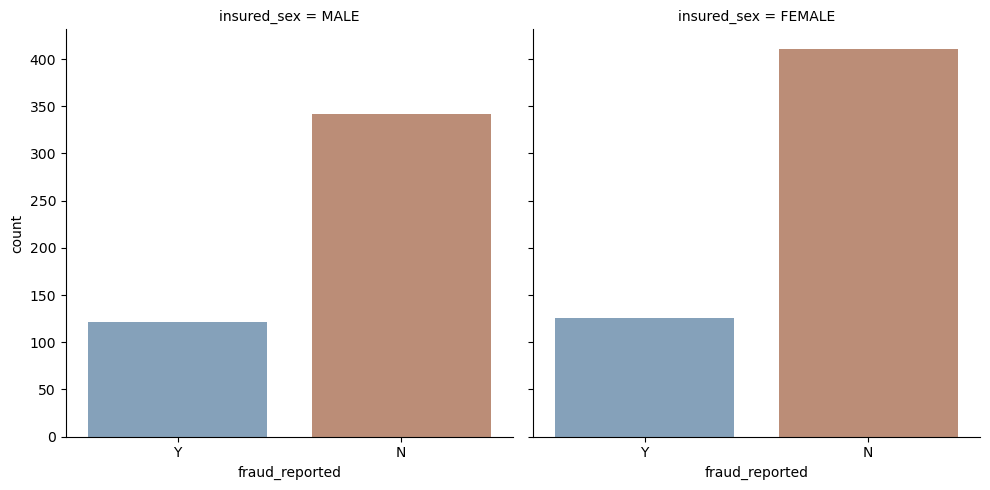

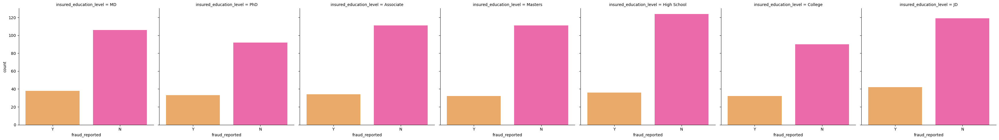

In [70]:
#Checking fraud_reported and policy_state
sns.catplot(x = 'fraud_reported', col = 'policy_state', data = df, kind = 'count', palette = 'spring_r')

#Checking fraud_reported and policy_csl
sns.catplot(x= 'fraud_reported', col='policy_csl', data = df, palette='tab20b_r', kind ='count')

#Checking fraud_reported in insured_sex
sns.catplot(x= 'fraud_reported', col='insured_sex', data=df, kind='count', palette='twilight_shifted')

#Checking fraud_reported in insured_education_level
sns.catplot(x='fraud_reported', col='insured_education_level', data=df, kind='count', palette='spring_r')
plt.show()

- In the first plot we see very less amount of frauds reported in all the three policy states.
- In the second plot we see frauds reported is less in all the three categories.
- In the third plot we see females have more amounts of no fraud cases as compared to males.
- In the fourth plot we see High School graduates have more amounts of no fraud cases as compared to others.

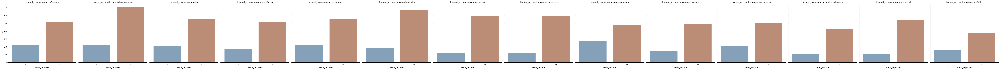

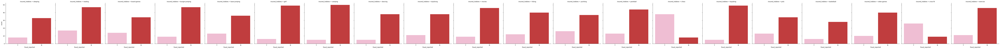

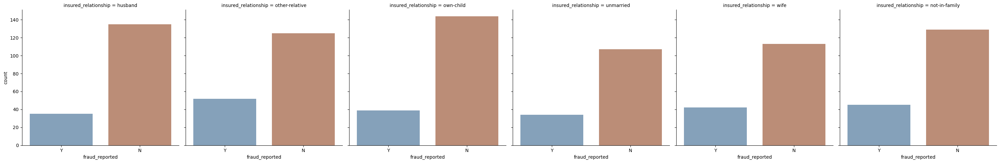

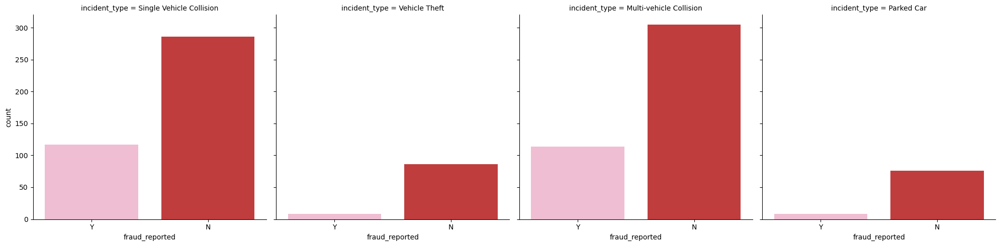

In [74]:
#Checking fraud_reported in insured_occupation
sns.catplot(x= 'fraud_reported', col='insured_occupation', data=df, kind='count', palette='twilight_shifted')

#Checking fraud_reported in insured_hobbies
sns.catplot(x= 'fraud_reported', col='insured_hobbies', data=df, kind='count', palette='tab20_r')

#Checking fraud_reported in insured_relationship
sns.catplot(x= 'fraud_reported', col='insured_relationship', data=df, kind='count', palette='twilight_shifted')

#Checking fraud_reported in incident_type
sns.catplot(x= 'fraud_reported', col='incident_type', data=df, kind='count', palette='tab20_r')
plt.show()

- In the first plot we see machine_op_inspct and prof-speciality have more amount of no fraud cases as compared to others.
- In the second plot we see those having hobbies like exercise, basketball, kaykaying, dancing, camping, golf and sleeping have very less amount of fraud cases where as those who play chess have the highest amount of fraud cases.
- In the third plot we see that husband and unmarried have less fraud as compared to others.
- In the fourth plot we see Vehicle Theft and Parked Car have very less fraud reported as compared to ohters.

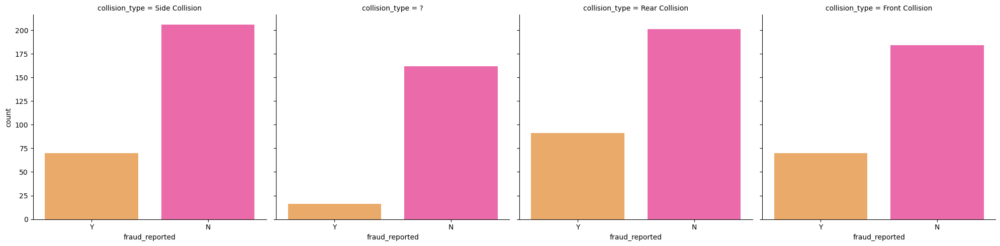

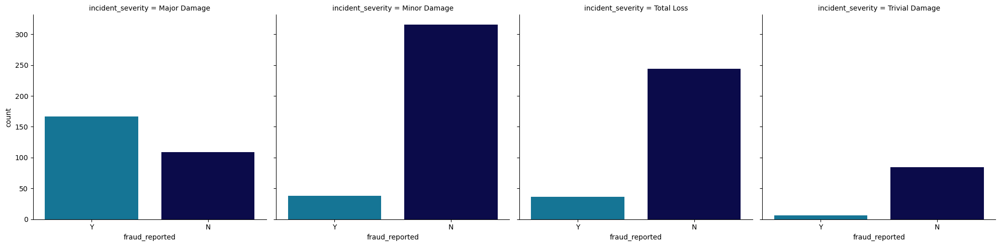

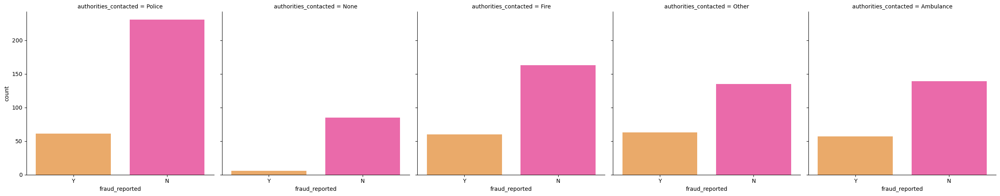

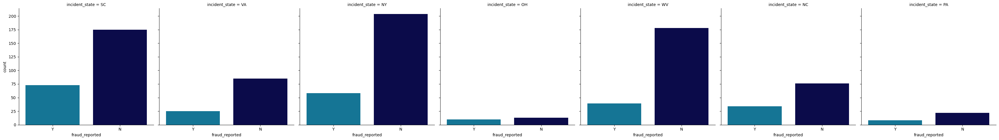

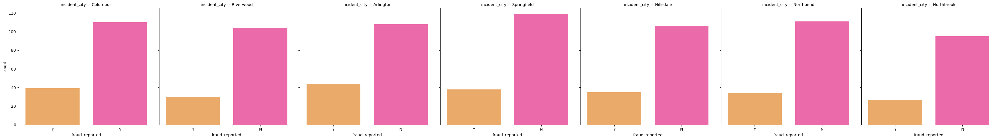

In [75]:
#Checking fraud_reported in collision_type
sns.catplot(x= 'fraud_reported', col='collision_type', data=df, kind='count', palette='spring_r')

#Checking fraud_reported in incident_severity
sns.catplot(x= 'fraud_reported', col='incident_severity', data=df, kind='count', palette='ocean_r')

#Checking fraud_reported in authorities_contacted
sns.catplot(x= 'fraud_reported', col='authorities_contacted', data=df, kind='count', palette='spring_r')

#Checking fraud_reported in incident_state
sns.catplot(x= 'fraud_reported', col='incident_state', data=df, kind='count', palette='ocean_r')

#Checking fraud_reported in incident_city
sns.catplot(x= 'fraud_reported', col='incident_city', data=df, kind='count', palette='spring_r')
plt.show()

- In the first plot we see that those with unknown collision type have the least fraud reported as compared to others.
- In the second plot we see that Trivial Damage has the least fraud reported followed by Total Loss and Minor Damage and Major Damage has higher fraud reported among all.
- In the third plot we see that those with no authorities contact has the least fraud reported as compared to others.
- In the fourth plot we see that the incident states OH followed by PA have the least fraud reported and not reported among others.
- In the fifth plot we see that every city has fraud reported.

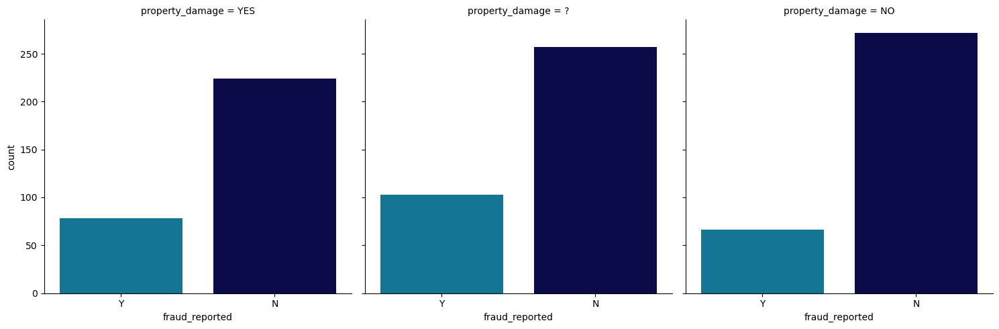

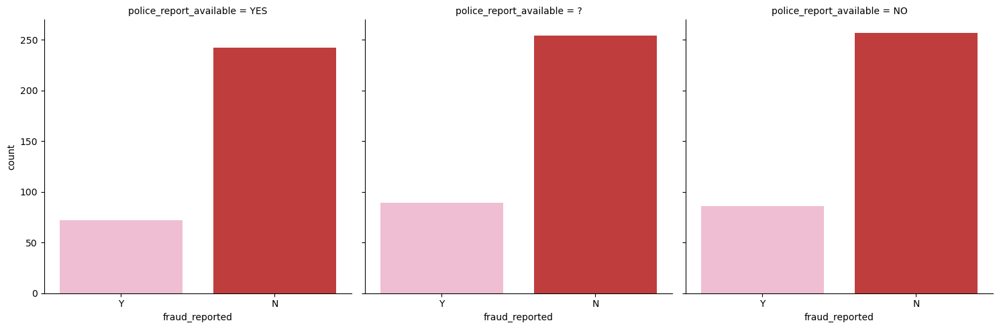

In [76]:
#Checking fraud_reported in property_damage
sns.catplot(x= 'fraud_reported', col='property_damage', data=df, kind='count', palette='ocean_r')

#Checking fraud_reported in police_report_available
sns.catplot(x= 'fraud_reported', col='police_report_available', data=df, kind='count', palette='tab20_r')
plt.show()

- In the first plot we see that unknown property damage has more fraud reported than others.
- In the second plot we see that unknown fraud report is more than others.

### Multivariate Analysis

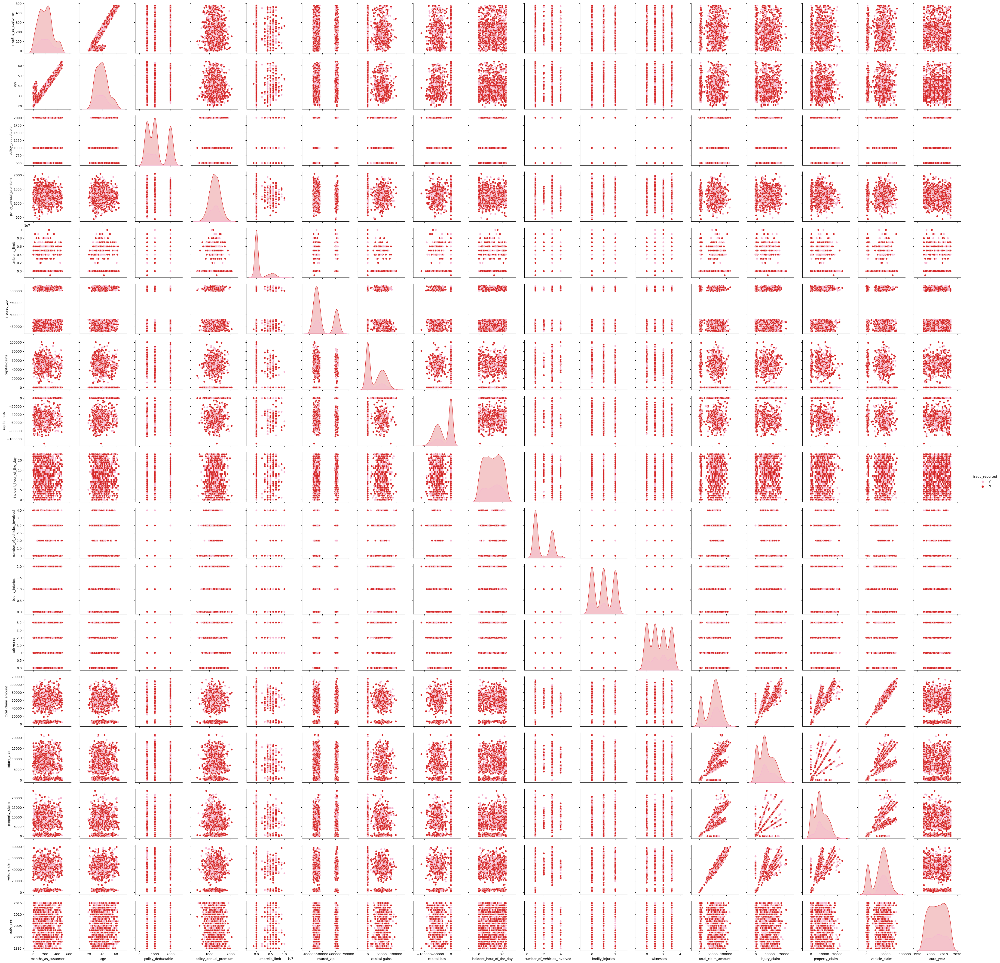

In [20]:
sns.pairplot(df, hue="fraud_reported", palette ="tab20_r")
plt.show()

- The above pair plot gives the pairwise relationship between features on the basis of "fraud_reported".
- On the diagonal we notice the distribution plot.
- We can see some outliers here, let's plot boxplot to check for outliers.

### Checking for Outliers

In [22]:
#Checking for numerical columns
num_col = []
for i in df.dtypes.index:
    if df.dtypes[i] != "object":
        num_col.append(i)
print("Numerical columns:", num_col)
print("\n")

Numerical columns: ['months_as_customer', 'age', 'policy_deductable', 'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year']




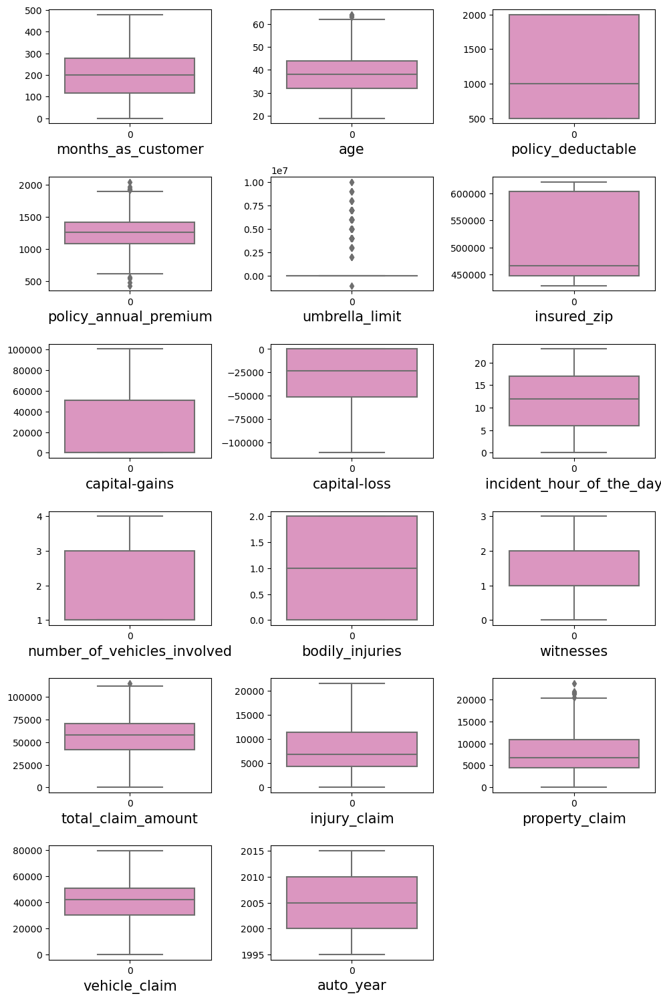

In [23]:
#Checking for outliers by box plot
plt.figure(figsize= (10, 15), facecolor="white")
plotnumber=1
for col in num_col:
    if plotnumber<=17:
        ax = plt.subplot(6,3,plotnumber)
        sns.boxplot(df[col], palette = "Set2_r")
        plt.xlabel(col, fontsize=15)
        plt.yticks(rotation=0, fontsize=10)
    plotnumber+=1
plt.tight_layout()    

We can see the presence of outliers in age, policy_annual_premium, umbrella_limit and total_claim_amount. We have to deal with them.

Before dealing with the outliers, let's encode the categorical columns.

### Ordinal Encoder

In [8]:
#Let's convert categorical values to numerical using Ordinal Encoder

from sklearn.preprocessing import OrdinalEncoder
OE = OrdinalEncoder()
for i in df.columns:
    if df[i].dtypes=='object':
        df[i] = OE.fit_transform(df[i].values.reshape(-1, 1))
df        

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
policy_bind_date,,,,,,,,,,,,,,,,,,,,,
2014-10-17,328,48,2.0,1.0,1000,1406.91,0,466132,1.0,4.0,...,2,2.0,71610,6510,13020,52080,10.0,1.0,2004,1.0
2006-06-27,228,42,1.0,1.0,2000,1197.22,5000000,468176,1.0,4.0,...,0,0.0,5070,780,780,3510,8.0,12.0,2007,1.0
2000-09-06,134,29,2.0,0.0,2000,1413.14,5000000,430632,0.0,6.0,...,3,1.0,34650,7700,3850,23100,4.0,30.0,2007,0.0
1990-05-25,256,41,0.0,1.0,2000,1415.74,6000000,608117,0.0,6.0,...,2,1.0,63400,6340,6340,50720,3.0,34.0,2014,1.0
2014-06-06,228,44,0.0,2.0,1000,1583.91,6000000,610706,1.0,0.0,...,1,1.0,6500,1300,650,4550,0.0,31.0,2009,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1991-07-16,3,38,2.0,2.0,1000,1310.80,0,431289,0.0,5.0,...,1,0.0,87200,17440,8720,61040,6.0,6.0,2006,0.0
2014-01-05,285,41,0.0,0.0,1000,1436.79,0,608177,0.0,6.0,...,3,0.0,108480,18080,18080,72320,13.0,28.0,2015,0.0
2003-02-17,130,34,2.0,1.0,500,1383.49,3000000,442797,0.0,5.0,...,3,2.0,67500,7500,7500,52500,11.0,19.0,1996,0.0


We have encoded all the columns now. Let's check for outliers for all the columns and deal with them.

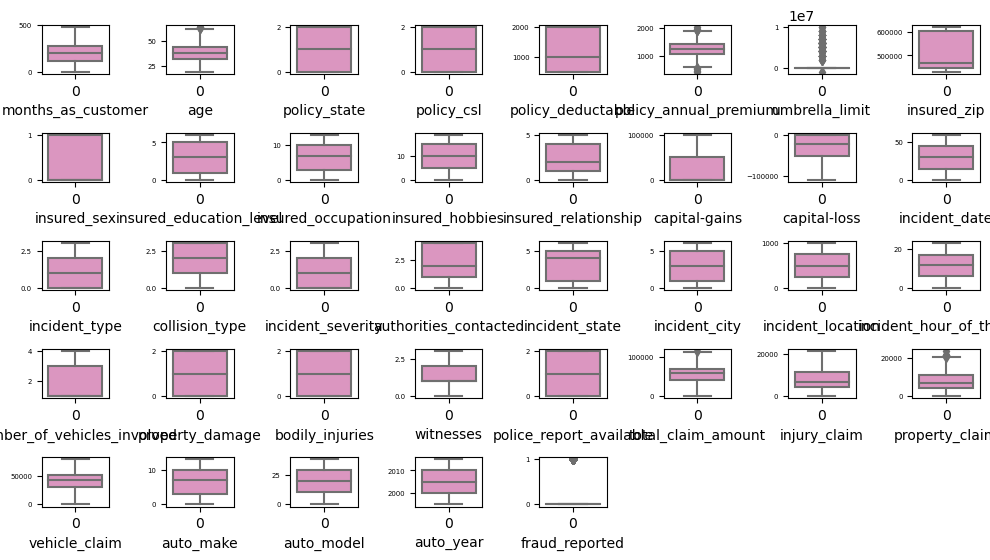

In [51]:
#Again checking for outliers in all the columns by box plot
plt.figure(figsize= (10, 15), facecolor="white")
plotnumber=1
for col in df:
    if plotnumber<=37:
        ax = plt.subplot(14,8,plotnumber)
        sns.boxplot(df[col], palette = "Set2_r")
        plt.xlabel(col, fontsize=10)
        plt.yticks(rotation=0, fontsize=5)
    plotnumber+=1
plt.tight_layout()    

We can see the presence of outliers in age, policy_annual_premium, umbrella_limit, total_claim_amount, property_claim and fraud_reported. Let's deal with them using Z Score or IQR Mehtods.

### Z Score Method

In [9]:
from scipy.stats import zscore
import numpy as np

out_features = df[['age', 'policy_annual_premium', 'umbrella_limit', 'total_claim_amount', 'property_claim', 'fraud_reported']]
z = np.abs(zscore(df))
z.shape

(1000, 37)

In [10]:
threshold = 3
print(np.where(z>3))

(array([ 31,  48,  88, 115, 119, 229, 248, 262, 314, 430, 458, 500, 503,
       657, 700, 763, 807, 875, 922, 975], dtype=int64), array([ 6,  6,  6,  6,  6,  5,  5,  6,  6,  6,  6, 31,  6,  6,  6,  5, 14,
        6,  6,  6], dtype=int64))


In [11]:
z.iloc[31,6]

3.0044538458871766

In [12]:
#Removing the data above Zscore and creating new df
df1= df[(z<3).all(axis=1)]
df1.shape

(980, 37)

In [13]:
#Shape of old and new dataframe
print('Shape of Old dataframe :', df.shape)
print('Shape of New dataframe :', df1.shape)

Shape of Old dataframe : (1000, 37)
Shape of New dataframe : (980, 37)


In [14]:
print("Data Loss Percentage :", ((df.shape[0]-df1.shape[0])/df.shape[0])*100)

Data Loss Percentage : 2.0


There is only 2% data loss. Great!

In [15]:
df=df1

### IQR Method

In [59]:
#Let's find more outliers by IQR Method
#1st quantile
Q1 = out_features.quantile(0.25)

#3rd quantile
Q3 = out_features.quantile(0.75)

#IQR
IQR = Q3 - Q1

df2 = df[~((df < (Q1 - 1.5 * IQR))| (df > (Q3 + 1.5 * IQR))).any(axis=1)]

In [60]:
df2.shape

(599, 37)

In [61]:
print("Data Loss Percentage after removing outliers with IQR method :", ((df.shape[0]-df2.shape[0])/df.shape[0])*100)

Data Loss Percentage after removing outliers with IQR method : 38.87755102040816


It is not acceptable as there is so much data loss.

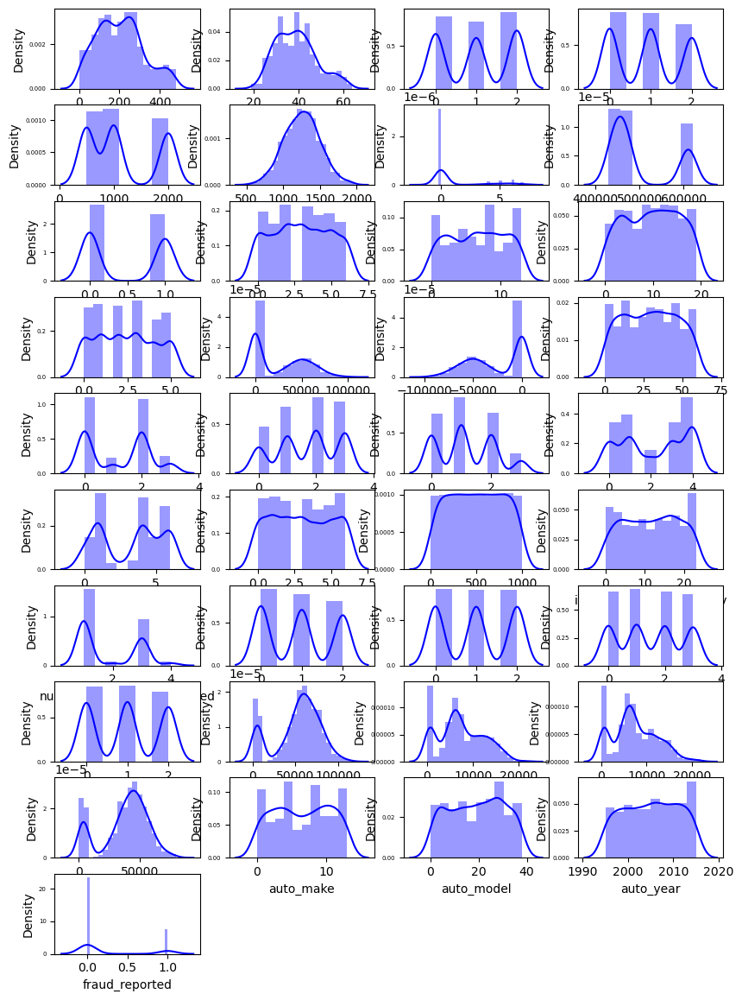

In [77]:
#Let's check how data is distributed in each column
plt.figure(figsize=(10, 20), facecolor='white')
plotnumber=1

for column in df:
    if plotnumber<=37:
        ax = plt.subplot(14,4, plotnumber)
        sns.distplot(df[column], color='b')
        plt.xlabel(column, fontsize=10)
        plt.yticks(rotation=0, fontsize=5)
    plotnumber+=1
plt.show()    

The data looks better than before. Let's go ahead.

### Checking for correlation

In [78]:
#Let's see the correlation between features and label
cor = df.corr()
cor

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
months_as_customer,1.000000,0.922960,-0.007183,-0.021855,0.031041,-0.003814,0.018213,0.029572,0.059644,-0.000731,...,0.063574,0.024521,0.058761,0.065062,0.036660,0.055941,0.049734,0.005130,0.000869,0.021285
age,0.922960,1.000000,-0.020012,-0.013323,0.032036,0.005330,0.013256,0.035864,0.073790,0.001647,...,0.056360,0.019424,0.067812,0.077149,0.062375,0.058918,0.033757,0.015322,0.005594,0.013279
policy_state,-0.007183,-0.020012,1.000000,0.001653,0.017612,0.015089,-0.010921,0.020669,-0.018002,-0.027173,...,0.025838,0.072142,-0.014693,-0.048188,-0.006420,-0.006411,0.010259,-0.018008,-0.001160,0.034587
policy_csl,-0.021855,-0.013323,0.001653,1.000000,0.009912,0.032654,0.013504,0.005593,-0.003405,0.008337,...,0.071361,-0.005171,-0.054128,-0.080098,-0.042876,-0.043987,-0.009395,0.042905,-0.030370,-0.032509
policy_deductable,0.031041,0.032036,0.017612,0.009912,1.000000,-0.008300,0.013471,-0.004399,-0.006977,0.014101,...,0.071709,0.030542,0.023835,0.038459,0.071031,0.005279,-0.028032,-0.002591,0.030569,0.015774
policy_annual_premium,-0.003814,0.005330,0.015089,0.032654,-0.008300,1.000000,-0.014107,0.047651,0.041312,-0.021400,...,0.003433,0.023249,-0.000223,-0.024119,-0.014073,0.009521,0.009311,-0.038226,-0.042446,-0.012686
umbrella_limit,0.018213,0.013256,-0.010921,0.013504,0.013471,-0.014107,1.000000,0.004481,0.018068,-0.030887,...,-0.001363,-0.037006,-0.047348,-0.046298,-0.021380,-0.048740,0.012857,0.015360,0.027952,0.044729
insured_zip,0.029572,0.035864,0.020669,0.005593,-0.004399,0.047651,0.004481,1.000000,-0.038086,0.017201,...,0.016142,-0.025224,-0.035357,-0.019463,-0.007904,-0.042364,-0.020518,0.021858,-0.041291,0.009699
insured_sex,0.059644,0.073790,-0.018002,-0.003405,-0.006977,0.041312,0.018068,-0.038086,1.000000,0.010068,...,0.039343,0.023181,-0.016275,0.008472,-0.008744,-0.022720,0.019996,-0.018657,-0.033336,0.020582
insured_education_level,-0.000731,0.001647,-0.027173,0.008337,0.014101,-0.021400,-0.030887,0.017201,0.010068,1.000000,...,0.021747,0.039406,0.079458,0.086600,0.062230,0.072782,0.060043,0.042735,0.054438,0.013116


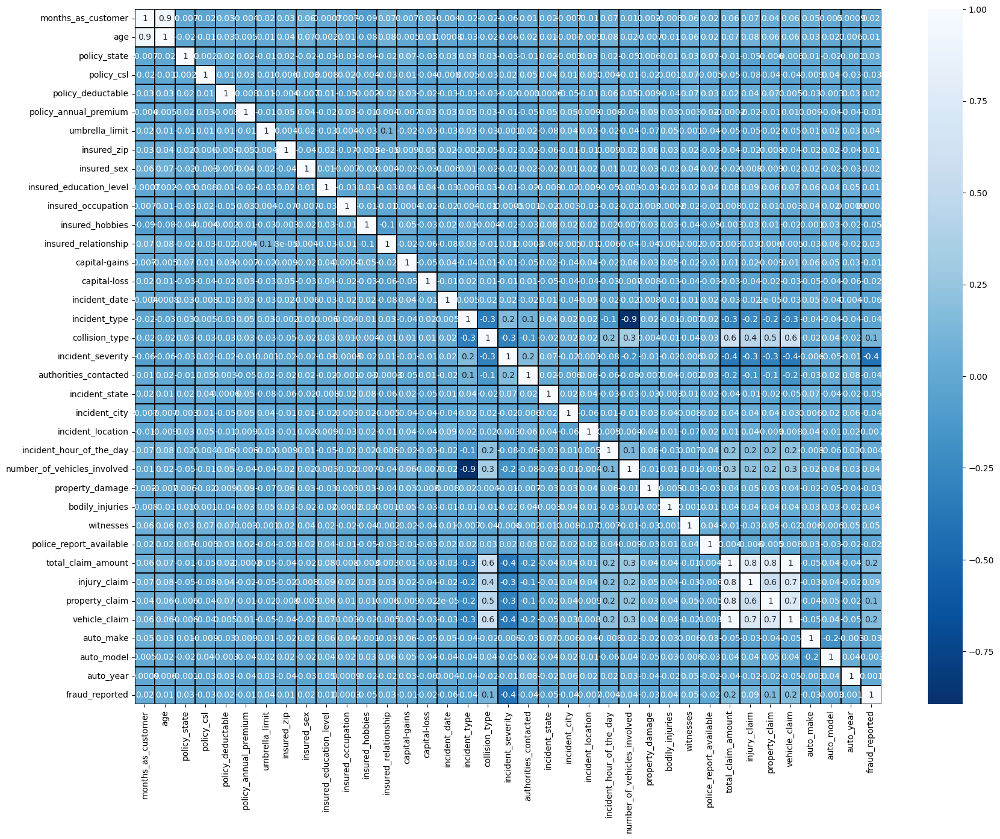

In [79]:
#Visualizing correlation by plotting a heatmap
plt.figure(figsize = (20, 15))
sns.heatmap(df.corr(), linewidths = 0.1, fmt=".1g", linecolor = "black", annot = True, cmap = "Blues_r")
plt.yticks(rotation=0)
plt.show()

- The above heatmap shows the correlation between features and label.
- We can noitce that there are no much positive correlations between features and label.
- It looks very clumsy here so we are not able to distinguish between the features which are positively and negatively correlated with the label. Let's sort the correlations in increasing order to distinguish.

In [80]:
cor['fraud_reported'].sort_values(ascending = False)

fraud_reported                 1.000000
vehicle_claim                  0.170782
total_claim_amount             0.163969
property_claim                 0.139101
collision_type                 0.107403
injury_claim                   0.088812
witnesses                      0.049974
umbrella_limit                 0.044729
number_of_vehicles_involved    0.043535
bodily_injuries                0.039184
policy_state                   0.034587
insured_relationship           0.026575
months_as_customer             0.021285
insured_sex                    0.020582
policy_deductable              0.015774
age                            0.013279
insured_education_level        0.013116
insured_zip                    0.009699
incident_hour_of_the_day       0.004326
auto_year                      0.001152
insured_occupation             0.000277
auto_model                    -0.002825
incident_location             -0.007499
policy_annual_premium         -0.012686
capital-gains                 -0.014993


Here, we can see that there are no much correlations between features and label. Let's plot bar plot for more surety.

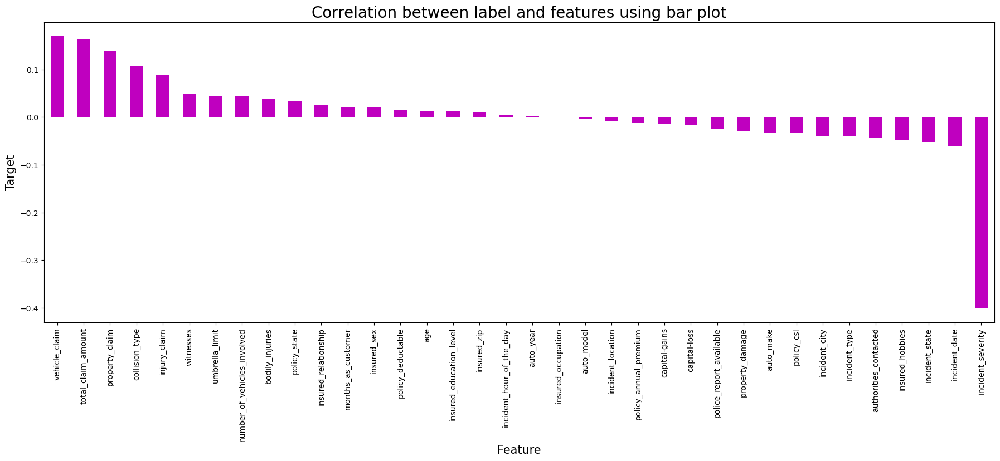

In [81]:
#Visualizing the correlation using bar plot
plt.figure(figsize = (22,7))
df.corr()['fraud_reported'].sort_values(ascending = False).drop(['fraud_reported']).plot(kind='bar', color='m')
plt.xlabel('Feature', fontsize=15)
plt.ylabel('Target', fontsize=15)
plt.title("Correlation between label and features using bar plot", fontsize=20)
plt.show()

Everything looks good, no need to remove anything. Let's move ahead.

### Checking for skewness

In [16]:
df.skew()

months_as_customer             0.362608
age                            0.475385
policy_state                  -0.038157
policy_csl                     0.098248
policy_deductable              0.476090
policy_annual_premium          0.035964
umbrella_limit                 1.801424
insured_zip                    0.837283
insured_sex                    0.139324
insured_education_level        0.006286
insured_occupation            -0.055360
insured_hobbies               -0.061488
insured_relationship           0.078339
capital-gains                  0.466619
capital-loss                  -0.376884
incident_date                  0.002604
incident_type                  0.090563
collision_type                -0.194015
incident_severity              0.277726
authorities_contacted         -0.114044
incident_state                -0.149255
incident_city                  0.043882
incident_location             -0.003369
incident_hour_of_the_day      -0.039280
number_of_vehicles_involved    0.509725


Here we can see the presence of skewness in umbrella_limit, insured_zip and fraud_reported. Let's deal with them using transformation method.

In [17]:
#Removing skewness using transformation methods
df['umbrella_limit'] = np.sqrt(df['umbrella_limit'])

df['insured_zip'] = np.sqrt(df['insured_zip'])

df['fraud_reported'] = np.sqrt(df['fraud_reported'])

In [18]:
#Let's check
df.skew()

months_as_customer             0.362608
age                            0.475385
policy_state                  -0.038157
policy_csl                     0.098248
policy_deductable              0.476090
policy_annual_premium          0.035964
umbrella_limit                 1.648539
insured_zip                    0.820824
insured_sex                    0.139324
insured_education_level        0.006286
insured_occupation            -0.055360
insured_hobbies               -0.061488
insured_relationship           0.078339
capital-gains                  0.466619
capital-loss                  -0.376884
incident_date                  0.002604
incident_type                  0.090563
collision_type                -0.194015
incident_severity              0.277726
authorities_contacted         -0.114044
incident_state                -0.149255
incident_city                  0.043882
incident_location             -0.003369
incident_hour_of_the_day      -0.039280
number_of_vehicles_involved    0.509725


In [19]:
#There are still some skewness left let's reduce it again
df['umbrella_limit'] = np.cbrt(df['umbrella_limit'])

df['insured_zip'] = np.cbrt(df['insured_zip'])

df['fraud_reported'] = np.cbrt(df['fraud_reported'])

In [20]:
df.skew()

months_as_customer             0.362608
age                            0.475385
policy_state                  -0.038157
policy_csl                     0.098248
policy_deductable              0.476090
policy_annual_premium          0.035964
umbrella_limit                 1.591289
insured_zip                    0.808854
insured_sex                    0.139324
insured_education_level        0.006286
insured_occupation            -0.055360
insured_hobbies               -0.061488
insured_relationship           0.078339
capital-gains                  0.466619
capital-loss                  -0.376884
incident_date                  0.002604
incident_type                  0.090563
collision_type                -0.194015
incident_severity              0.277726
authorities_contacted         -0.114044
incident_state                -0.149255
incident_city                  0.043882
incident_location             -0.003369
incident_hour_of_the_day      -0.039280
number_of_vehicles_involved    0.509725


In [21]:
df['umbrella_limit'] = np.sqrt(df['umbrella_limit'])

df['insured_zip'] = np.log(df['insured_zip'])

df['fraud_reported'] = np.sqrt(df['fraud_reported'])

In [22]:
df.skew()

months_as_customer             0.362608
age                            0.475385
policy_state                  -0.038157
policy_csl                     0.098248
policy_deductable              0.476090
policy_annual_premium          0.035964
umbrella_limit                 1.585097
insured_zip                    0.802553
insured_sex                    0.139324
insured_education_level        0.006286
insured_occupation            -0.055360
insured_hobbies               -0.061488
insured_relationship           0.078339
capital-gains                  0.466619
capital-loss                  -0.376884
incident_date                  0.002604
incident_type                  0.090563
collision_type                -0.194015
incident_severity              0.277726
authorities_contacted         -0.114044
incident_state                -0.149255
incident_city                  0.043882
incident_location             -0.003369
incident_hour_of_the_day      -0.039280
number_of_vehicles_involved    0.509725


We have reduced the skewness now, let's proceed ahead.

### Separating features and label

In [23]:
x = df.drop("fraud_reported", axis=1)
y = df["fraud_reported"]

### Feature scaling using Standard Scaler

In [24]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x = pd.DataFrame(scaler.fit_transform(x), columns = x.columns)
x

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,...,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year
0,1.069568,0.983352,1.179821,0.067231,-0.224643,0.620031,-0.484167,-0.456752,1.071971,0.532901,...,0.002498,0.466378,1.266345,0.718507,-0.187627,1.176015,0.753824,0.851959,-1.640447,-0.188594
1,0.202726,0.329711,-0.024580,0.067231,1.412161,-0.248448,2.060686,-0.424492,1.071971,0.532901,...,-1.221626,-1.333033,-1.205803,-1.808821,-1.361005,-1.378984,-1.824679,0.355279,-0.651740,0.310476
2,-0.612105,-1.086511,1.179821,-1.175916,1.412161,0.645834,2.060686,-1.040801,-0.932861,1.556905,...,1.226623,1.366083,0.030271,-0.685311,0.056059,-0.738147,-0.784678,-0.638083,0.966145,0.310476
3,0.445442,0.220771,-1.228980,0.067231,1.412161,0.656603,2.099646,1.503710,-0.932861,1.556905,...,0.002498,0.466378,0.030271,0.406674,-0.222439,-0.218380,0.681623,-0.886423,1.325675,1.474975
4,0.202726,0.547591,-1.228980,1.310379,-0.224643,1.353117,2.099646,1.535033,1.071971,-1.515109,...,-1.221626,-0.433327,0.030271,-1.754507,-1.254521,-1.406121,-1.769467,-1.631444,1.056027,0.643190
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
975,-1.747669,-0.106050,1.179821,1.310379,-0.224643,0.221970,-0.484167,-1.029561,-0.932861,1.044903,...,-1.221626,-0.433327,-1.205803,1.310648,2.050597,0.278425,1.229496,-0.141402,-1.191035,0.144119
976,0.696826,0.220771,-1.228980,-1.175916,-0.224643,0.743786,-0.484167,1.504437,-0.932861,1.556905,...,1.226623,1.366083,-1.205803,2.118906,2.181655,2.232248,1.828332,1.596980,0.786380,1.641332
977,-0.646779,-0.541810,1.179821,0.067231,-1.043045,0.523032,1.954628,-0.835409,-0.932861,1.044903,...,1.226623,1.366083,1.266345,0.562400,0.015103,0.023760,0.776121,1.100300,-0.022562,-1.519450
978,2.196463,2.508513,-1.228980,1.310379,1.412161,0.412986,2.060686,-0.853464,1.071971,-1.515109,...,-1.221626,-0.433327,1.266345,-0.216992,-0.451791,-0.452171,-0.071170,-1.383104,-1.280917,-1.186736


We have scaled the features to reduce biasness.

In [26]:
#Checking for nulls
x.isna().sum()

months_as_customer             0
age                            0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 1
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_cla

In [31]:
#Filling the null in umbrella_limit
x['umbrella_limit'] = x['umbrella_limit'].fillna(x['umbrella_limit'].mean())

In [32]:
#Checking for nulls again
x.isna().sum()

months_as_customer             0
age                            0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_cla

Successfully filled the null.

### Checking for VIF

In [33]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
vif = pd.DataFrame()
vif["VIF Values"] = [variance_inflation_factor(x.values, i)
                    for i in range(len(x.columns))]
vif["Features"] = x.columns
vif

,VIF Values,Features
0,6.898883,months_as_customer
1,6.921526,age
2,1.030421,policy_state
3,1.030622,policy_csl
4,1.040973,policy_deductable
5,1.038032,policy_annual_premium
6,1.037179,umbrella_limit
7,1.037840,insured_zip
8,1.027481,insured_sex
9,1.041053,insured_education_level


Everything looks good, nothing to remove.

In [34]:
#Checking for value counts in label
y.value_counts()

0.0    740
1.0    240
Name: fraud_reported, dtype: int64

It is imbalanced so we have to makeit balanced. And as it is a categorical data we will use OverSampling or SMOTE method to balance it.

### OverSampling

In [35]:
from imblearn.over_sampling import SMOTE
SM = SMOTE()

x,y = SM.fit_resample(x,y)   

In [36]:
#Let's check again
y.value_counts()

1.0    740
0.0    740
Name: fraud_reported, dtype: int64

Successfully balanced. 

### Data Modelling

In [37]:
#Finding best random state
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
maxAccu = 0
maxRS = 0
for i in range(1,200):
    x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = 0.30, random_state=i)
    RFR = RandomForestClassifier()
    RFR.fit(x_train, y_train)
    pred = RFR.predict(x_test)
    acc = accuracy_score(y_test, pred)
    if acc>maxAccu:
        maxAccu = acc
        maxRS = i
        
print("Best accuracy score is", maxAccu, "at random_state", maxRS)        

Best accuracy score is 0.9166666666666666 at random_state 158


### Creating Train Test Split

In [38]:
x_train, x_test, y_train, y_test = train_test_split(x,y, test_size = 0.30, random_state=maxRS)

### Classification Algorithms

In [40]:
from sklearn.ensemble import RandomForestClassifier, ExtraTreesClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, accuracy_score
from sklearn.model_selection import cross_val_score

In [41]:
#Checking accuracy for Random Forest Classifier
RF = RandomForestClassifier()
RF.fit(x_train, y_train)
predRF = RF.predict(x_test)
print(accuracy_score(y_test, predRF))
print(confusion_matrix(y_test, predRF))
print(classification_report(y_test, predRF))

0.9211711711711712
[[209  17]
 [ 18 200]]
              precision    recall  f1-score   support

         0.0       0.92      0.92      0.92       226
         1.0       0.92      0.92      0.92       218

    accuracy                           0.92       444
   macro avg       0.92      0.92      0.92       444
weighted avg       0.92      0.92      0.92       444



In [42]:
#Logistic Regression
LR = LogisticRegression()
LR.fit(x_train, y_train)
predLR = LR.predict(x_test)
print(accuracy_score(y_test, predLR))
print(confusion_matrix(y_test, predLR))
print(classification_report(y_test, predLR))

0.7657657657657657
[[163  63]
 [ 41 177]]
              precision    recall  f1-score   support

         0.0       0.80      0.72      0.76       226
         1.0       0.74      0.81      0.77       218

    accuracy                           0.77       444
   macro avg       0.77      0.77      0.77       444
weighted avg       0.77      0.77      0.77       444



In [44]:
#Decisison Tree
DT = DecisionTreeClassifier()
DT.fit(x_train, y_train)
predDT = DT.predict(x_test)
print(accuracy_score(y_test, predDT))
print(confusion_matrix(y_test, predDT))
print(classification_report(y_test, predDT))

0.8468468468468469
[[186  40]
 [ 28 190]]
              precision    recall  f1-score   support

         0.0       0.87      0.82      0.85       226
         1.0       0.83      0.87      0.85       218

    accuracy                           0.85       444
   macro avg       0.85      0.85      0.85       444
weighted avg       0.85      0.85      0.85       444



In [45]:
#SVC
svc = SVC()
svc.fit(x_train, y_train)
predsvc = svc.predict(x_test)
print(accuracy_score(y_test, predsvc))
print(confusion_matrix(y_test, predsvc))
print(classification_report(y_test, predsvc))

0.8828828828828829
[[191  35]
 [ 17 201]]
              precision    recall  f1-score   support

         0.0       0.92      0.85      0.88       226
         1.0       0.85      0.92      0.89       218

    accuracy                           0.88       444
   macro avg       0.88      0.88      0.88       444
weighted avg       0.89      0.88      0.88       444



In [46]:
#Gradient Boosting
GBC = GradientBoostingClassifier()
GBC.fit(x_train, y_train)
predGBC = GBC.predict(x_test)
print(accuracy_score(y_test, predGBC))
print(confusion_matrix(y_test, predGBC))
print(classification_report(y_test, predGBC))

0.9121621621621622
[[204  22]
 [ 17 201]]
              precision    recall  f1-score   support

         0.0       0.92      0.90      0.91       226
         1.0       0.90      0.92      0.91       218

    accuracy                           0.91       444
   macro avg       0.91      0.91      0.91       444
weighted avg       0.91      0.91      0.91       444



In [47]:
#Ada Boost
AB = AdaBoostClassifier()
AB.fit(x_train, y_train)
predAB = AB.predict(x_test)
print(accuracy_score(y_test, predAB))
print(confusion_matrix(y_test, predAB))
print(classification_report(y_test, predAB))

0.8716216216216216
[[199  27]
 [ 30 188]]
              precision    recall  f1-score   support

         0.0       0.87      0.88      0.87       226
         1.0       0.87      0.86      0.87       218

    accuracy                           0.87       444
   macro avg       0.87      0.87      0.87       444
weighted avg       0.87      0.87      0.87       444



In [48]:
#Bagging Classifier
BC = BaggingClassifier()
BC.fit(x_train, y_train)
predBC = BC.predict(x_test)
print(accuracy_score(y_test, predBC))
print(confusion_matrix(y_test, predBC))
print(classification_report(y_test, predBC))

0.9121621621621622
[[203  23]
 [ 16 202]]
              precision    recall  f1-score   support

         0.0       0.93      0.90      0.91       226
         1.0       0.90      0.93      0.91       218

    accuracy                           0.91       444
   macro avg       0.91      0.91      0.91       444
weighted avg       0.91      0.91      0.91       444



In [49]:
#Extra Trees
ETC = ExtraTreesClassifier()
ETC.fit(x_train, y_train)
predETC = ETC.predict(x_test)
print(accuracy_score(y_test, predETC))
print(confusion_matrix(y_test, predETC))
print(classification_report(y_test, predETC))

0.9414414414414415
[[207  19]
 [  7 211]]
              precision    recall  f1-score   support

         0.0       0.97      0.92      0.94       226
         1.0       0.92      0.97      0.94       218

    accuracy                           0.94       444
   macro avg       0.94      0.94      0.94       444
weighted avg       0.94      0.94      0.94       444



Among all the classifiers Extra Trees Classifier gives the best accuracy i.e. 94%. Let's go ahead and and validate the scores.

### Cross Validation Score

In [50]:
#Checking cv score Random Forest Classifier
score = cross_val_score(RF,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y_test, predRF) - score.mean())

[0.76689189 0.86486486 0.89864865 0.94594595 0.93243243]
0.8817567567567568
Difference between Accuracy score and cross validation score is -  0.0394144144144144


In [51]:
#Checking cv score Logistic Regression
score = cross_val_score(LR,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y_test, predLR) - score.mean())

[0.70608108 0.73986486 0.74662162 0.75337838 0.76689189]
0.7425675675675676
Difference between Accuracy score and cross validation score is -  0.023198198198198128


In [52]:
#Checking cv score Decision Tree Classifier
score = cross_val_score(DT,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y_test, predDT) - score.mean())

[0.74324324 0.79391892 0.85472973 0.88851351 0.88851351]
0.8337837837837838
Difference between Accuracy score and cross validation score is -  0.01306306306306304


In [53]:
#Checking cv score Gradient Boosting Classifier
score = cross_val_score(GBC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y_test, predGBC) - score.mean())

[0.76351351 0.83783784 0.89189189 0.93243243 0.91554054]
0.8682432432432432
Difference between Accuracy score and cross validation score is -  0.04391891891891897


In [54]:
#Checking cv score SVC
score = cross_val_score(svc,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y_test, predsvc) - score.mean())

[0.81081081 0.82432432 0.85135135 0.91216216 0.91891892]
0.8635135135135135
Difference between Accuracy score and cross validation score is -  0.019369369369369394


In [55]:
#Checking cv score AdaBoost Classifier
score = cross_val_score(AB,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y_test, predAB) - score.mean())

[0.66554054 0.82094595 0.89527027 0.94256757 0.91554054]
0.847972972972973
Difference between Accuracy score and cross validation score is -  0.023648648648648574


In [56]:
#Checking cv score Bagging Classifier
score = cross_val_score(BC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y_test, predBC) - score.mean())

[0.79391892 0.83783784 0.87837838 0.93581081 0.91216216]
0.8716216216216216
Difference between Accuracy score and cross validation score is -  0.04054054054054057


In [57]:
#Checking cv score ExtraTrees Classifier
score = cross_val_score(ETC,x,y)
print(score)
print(score.mean())
print("Difference between Accuracy score and cross validation score is - ", accuracy_score(y_test, predETC) - score.mean())

[0.86148649 0.89527027 0.91891892 0.94594595 0.95945946]
0.9162162162162163
Difference between Accuracy score and cross validation score is -  0.02522522522522519


Here we can see that SVC gives the least difference between accuracy score and cross validation score. So we will go with it and tune the parameters and see if the scores increase or not.

### Hyper parameter Tuning

In [58]:
from sklearn.model_selection import GridSearchCV

In [59]:
#SVC
parameters = {'C': [0.1, 1, 10, 100, 1000], 
              'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
              'kernel': ['rbf']} 

In [60]:
grid = GridSearchCV(SVC(), parameters, cv=5)

In [61]:
grid.fit(x_train, y_train)

GridSearchCV(cv=5, estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']})

In [62]:
grid.best_params_

{'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}

In [63]:
final_model = SVC(C = 10,
                 gamma = 0.1,
                 kernel = 'rbf')

final_model.fit(x_train, y_train)
pred = final_model.predict(x_test)
acc = accuracy_score(y_test, pred)
print(acc*100)

95.72072072072072


We got 95.72% (~ 96%) accuracy on our final model. Great!

### Saving the model

In [64]:
#Let's go ahead and save the model
import pickle

filename = 'Fraud_report.pkl'
pickle.dump(final_model, open(filename, 'wb'))

In [65]:
loaded_model = pickle.load(open ('Fraud_report.pkl','rb'))
result = loaded_model.score(x_test, y_test)
print(result*100)

95.72072072072072


In [66]:
conclusion = pd.DataFrame([loaded_model.predict(x_test)[:], y_test[:]], index=["Predicted", "Original"])
conclusion

,0,1,2,3,4,5,6,7,8,9,...,434,435,436,437,438,439,440,441,442,443
Predicted,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0
Original,0.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,...,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0


Done!!!!

### Documentation

- First we imported all the necessary libraries.
- Then we loaded the data set.
- Performed the EDA and all the steps incuded in it like checking the shape, checking for column names, checking for nulls, separated numerical and categorical columns, data description, data info, etc.
- Then we performed data visualization:
    - Univariate
    - Bivariate
    - Multivariate
- Then we checked for outliers and removed it using Z Score and IQR methods.
- Z score gave less data loss of 3% as compared to IQR method so we went along with Z score method.
- We checked for correlation between features and label and found very less positive correlation.
- We checked for skewness and reduced it using tranformation methods.
- Separated features and label.
- Applied Standard Scaler to reduce biasness between features.
- Checked for VIF and since everything was <10 so there was no need to remove anything.
- Then we checked for the value counts in 'y', i.e. the label and as it was imbalanced we used OverSampling method to balance it.
- Then we did data modelling.
- We imported the classification algorithms.
- Checked for best random state.
- Created train test split.
- Trained all the models and got the accuracy score.
- Performed Cross Validation to get the least difference between accuracy and cross validation score and find the best model.
- Performed Hyper parameter tuning in order to increase the accuracy.
- Fitted the model.
- Checked for best parameters.
- Then saved the model using pickle for future use.
- Done!!!